# 1: Importing necessary Libraries

In [ ]:
# Import the necessary modules from skimage
from util.tools import load_img, show_image, show_image_contour, show_detected_face, plot_comparison, get_mask, generate_dead_pixel_mask, show_image_with_corners, getFaceRectangle, mergeBlurryFace
from skimage import data, color, io, transform, exposure, measure, morphology
from skimage.feature import canny, corner_harris, corner_peaks, Cascade
from skimage.filters import threshold_otsu, threshold_local, try_all_threshold, sobel, gaussian
from skimage.restoration import inpaint, denoise_tv_chambolle, denoise_bilateral
from skimage.segmentation import slic
from skimage.util import random_noise
from skimage.color import label2rgb
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np


In [92]:
def load_img(fname, dirname='images/'):
    try:
        # Load the image using skimage.io.imread
        img_path = dirname + fname
        Im_array = io.imread(img_path)
        
        # Check if the image has an alpha channel (4 channels)
        if Im_array.ndim == 3 and Im_array.shape[-1] == 4:
            # Remove the alpha channel by selecting the first three channels (RGB)
            Im_array = Im_array[..., :3]
        
        # Handle grayscale images (single channel)
        elif Im_array.ndim == 2:  # Grayscale image
            Im_array = np.expand_dims(Im_array, axis=-1)  # Convert to 3D (height, width, 1)
        
        return Im_array
    except Exception as e:
        print(f"Error loading image: {e}")
        return None

In [93]:

# Load the rocket image
rocket = data.rocket()


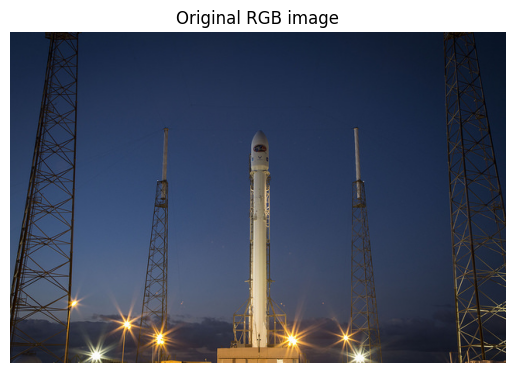

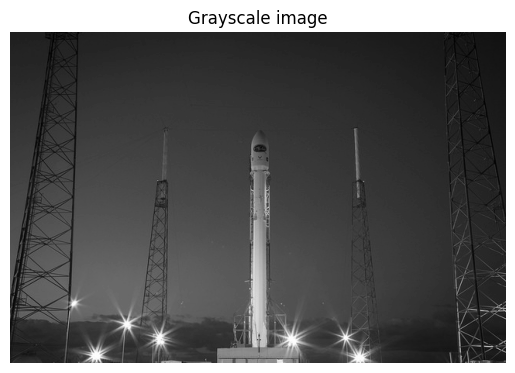

In [94]:

# Convert the image to grayscale
gray_scaled_rocket = color.rgb2gray(rocket)

# Show the original image
show_image(rocket, 'Original RGB image')

# Show the grayscale image
show_image(gray_scaled_rocket, 'Grayscale image')

# 2: Flipping images

In [95]:
seville_img = load_img('sevilleup(2).jpg')

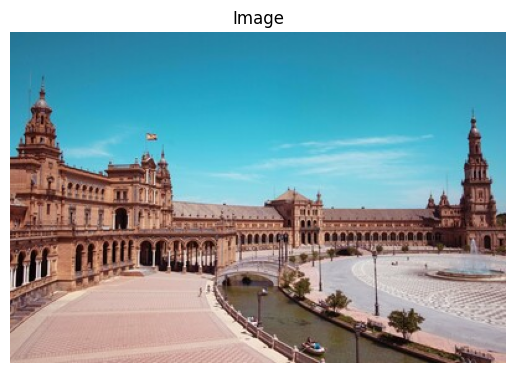

In [96]:
seville_vertical_flip = np.flipud(seville_img)
show_image(seville_vertical_flip)

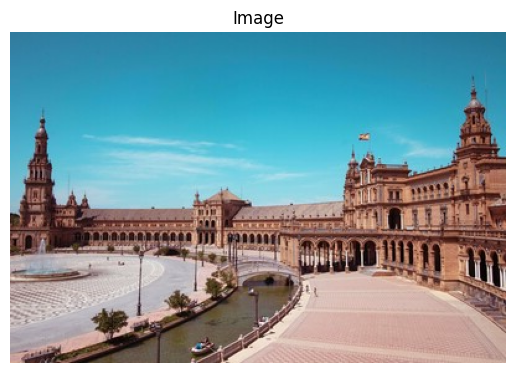

In [97]:
seville_horizontal_flip = np.fliplr(seville_vertical_flip)
show_image(seville_horizontal_flip)

# 3: Histograms

In [98]:
fruits_im = load_img('image.png')

In [99]:
# Obtain the red channel
red_channel = fruits_im[:, :, 0]
green_channel = fruits_im[:, :, 1]
blue_channel = fruits_im[:, :, 2]


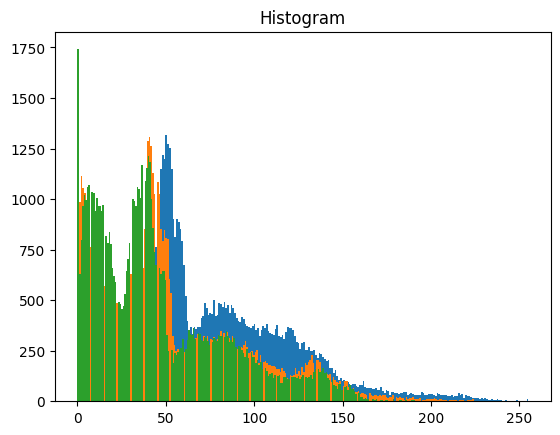

In [100]:

# Plot the red histogram with bins in a range of 256
plt.hist(red_channel.ravel(), bins=256)
plt.hist(green_channel.ravel(), bins=256)
plt.hist(blue_channel.ravel(), bins=256)

# Set title and show
plt.title('Histogram')
plt.show()

# 4: Thresholding

## 4.1: Global thresholding

In [101]:
chess_pieces_image = load_img('bw.jpg')

In [102]:
# Make the image grayscale using rgb2gray
chess_pieces_image_gray = color.rgb2gray(chess_pieces_image)

# Obtain the optimal threshold value with otsu
thresh = threshold_otsu(chess_pieces_image_gray)
thresh


0.552734375

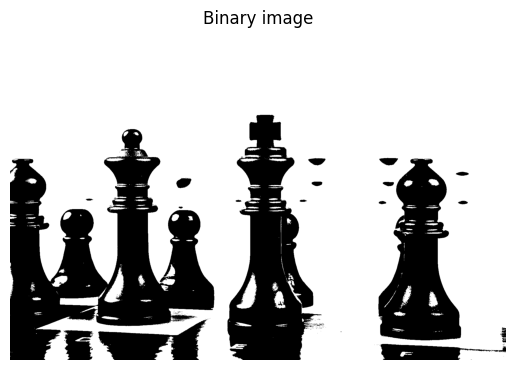

In [103]:
# Apply thresholding to the image
binary = chess_pieces_image_gray > thresh

# Show the image
show_image(binary, 'Binary image')

## 4.2: Local Thresholding

In [104]:
page_image = load_img('page_image.png')
page_image_gray = color.rgb2gray(page_image)


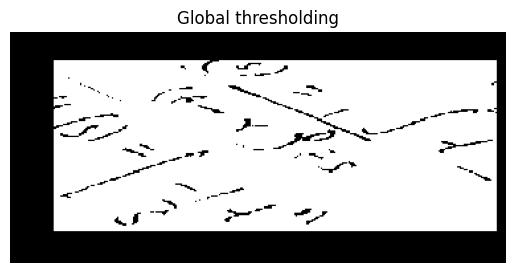

In [105]:
# Obtain the optimal otsu global thresh value
global_thresh = threshold_otsu(page_image_gray)

# Obtain the binary image by applying global thresholding
binary_global = page_image_gray > global_thresh

# Show the binary image obtained
show_image(binary_global, 'Global thresholding')

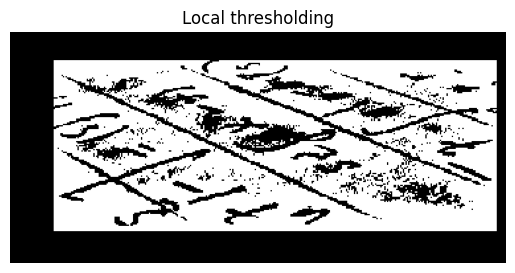

In [106]:
# Set the block size to 35
block_size = 69

# Obtain the optimal local thresholding
local_thresh = threshold_local(page_image_gray, block_size)

# Obtain the binary image by applying local thresholding
binary_local = page_image_gray > local_thresh

# Show the binary image
show_image(binary_local, 'Local thresholding')

## 4.3: Try_all Thresholds

In [107]:
fruits_im = load_img('fruits-2.jpg')

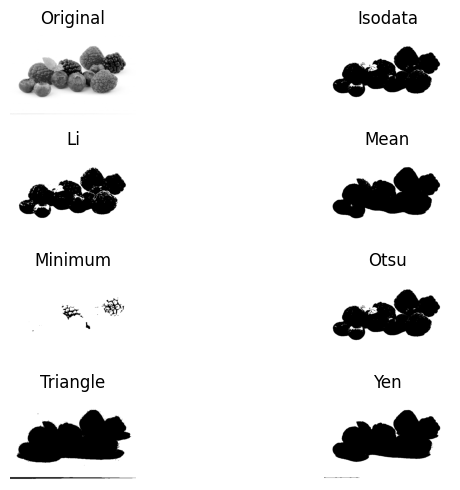

In [108]:
# Turn the fruits_image to grayscale
grayscale = color.rgb2gray(fruits_im)

# Use the try all method on the resulting grayscale image
fig, ax = try_all_threshold(grayscale, verbose=False)

# Show the resulting plots
plt.show()

In [109]:
tools_image = load_img('shapes52.jpg')

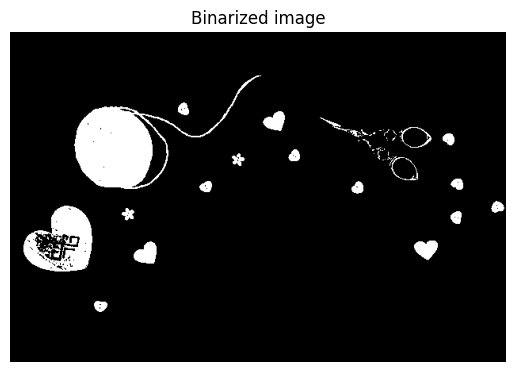

In [110]:
# Turn the image grayscale
gray_tools_image = color.rgb2gray(tools_image)

# Obtain the optimal thresh
thresh = threshold_otsu(gray_tools_image)

# Obtain the binary image by applying thresholding
binary_image = gray_tools_image > thresh

# Show the resulting binary image
show_image(binary_image, 'Binarized image')

# 5: Filtering

## 5.1: Edge Detection with Sobel Filter

In [111]:
soaps_image = load_img('soaps.jpg')

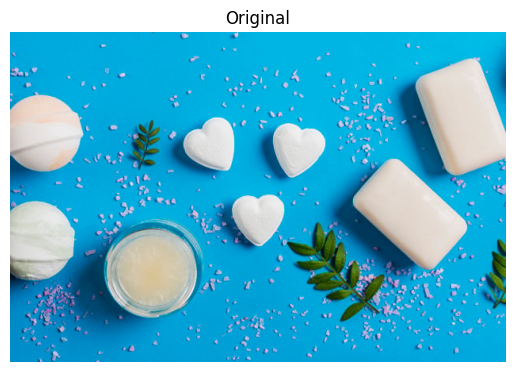

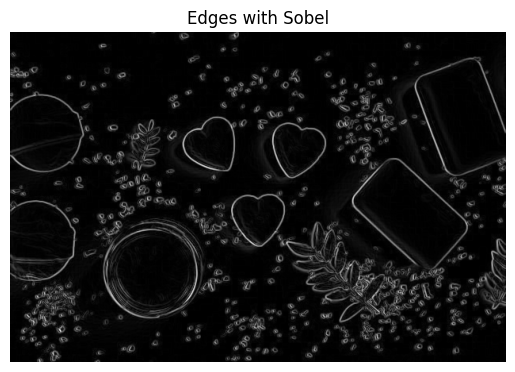

In [112]:
  # Make the image grayscale
soaps_image_gray = color.rgb2gray(soaps_image)

# Apply edge detection filter
edge_sobel = sobel(soaps_image_gray)

# Show original and resulting image to compare
show_image(soaps_image, "Original")
show_image(edge_sobel, "Edges with Sobel")

## 5.2: Gaussian Filter

In [113]:
building_image = load_img('building.jpg')

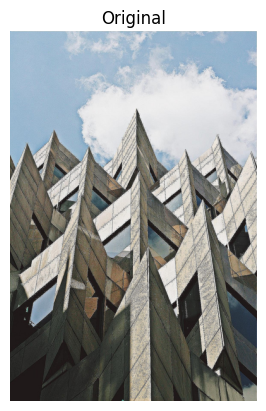

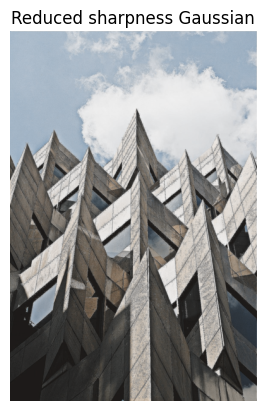

In [114]:
# Apply filter
gaussian_image = gaussian(building_image)

# Show original and resulting image to compare
show_image(building_image, "Original")
show_image(gaussian_image, "Reduced sharpness Gaussian")

# 6: Contrast Enhancement

In [115]:
chest_xray_image = load_img('chest_xray_image.png')

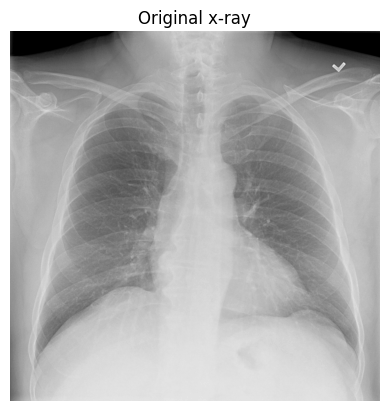

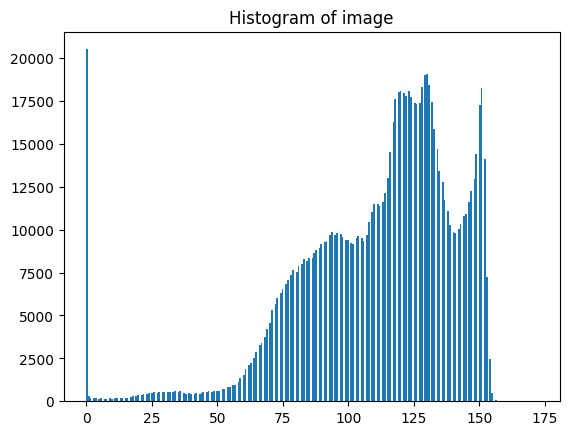

In [116]:
# Show original x-ray image and its histogram
show_image(chest_xray_image, 'Original x-ray')

plt.title('Histogram of image')
plt.hist(chest_xray_image.ravel(), bins=256)
plt.show()

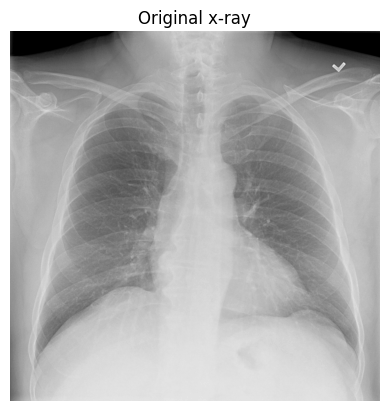

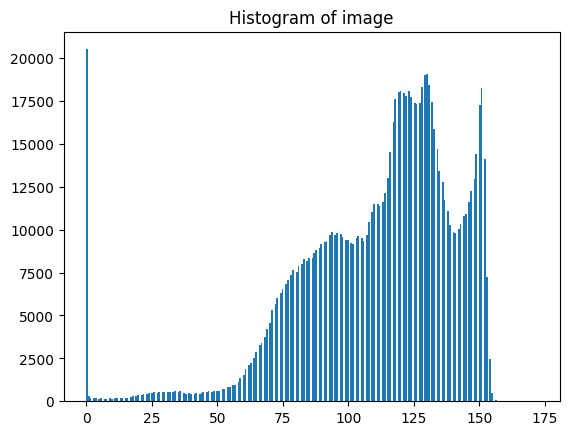

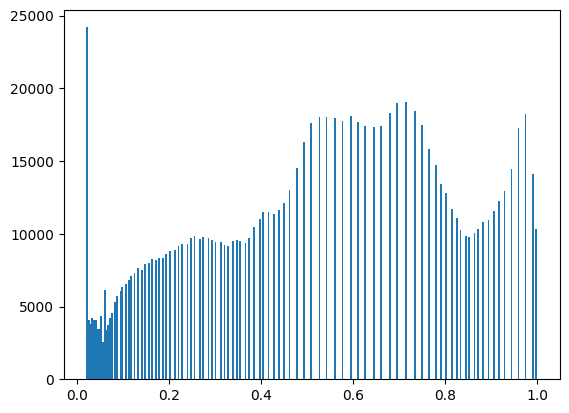

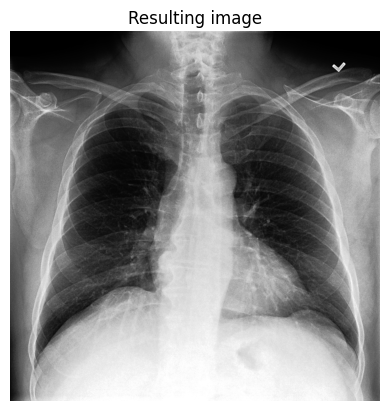

In [117]:
# Use histogram equalization to improve the contrast
xray_image_eq =  exposure.equalize_hist(chest_xray_image)
# Show original x-ray image and its histogram
show_image(chest_xray_image, 'Original x-ray')

plt.title('Histogram of image')
plt.hist(chest_xray_image.ravel(), bins=256)
plt.show()

# Use histogram equalization to improve the contrast
xray_image_eq =  exposure.equalize_hist(chest_xray_image)
plt.hist(xray_image_eq.ravel(), bins=256)
plt.show()

# Show the resulting image
show_image(xray_image_eq, 'Resulting image')

In [118]:
image_aerial = load_img('aerial.png')

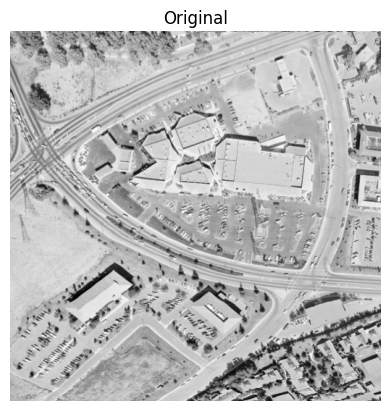

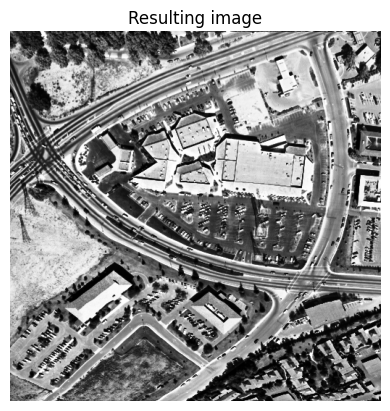

In [119]:
# Use histogram equalization to improve the contrast
image_eq =  exposure.equalize_hist(image_aerial)

# Show the original and resulting image
show_image(image_aerial, 'Original')
show_image(image_eq, 'Resulting image')

In [120]:
# Load the image
original_image = data.coffee()


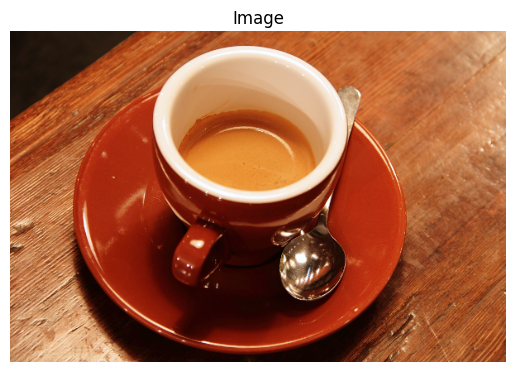

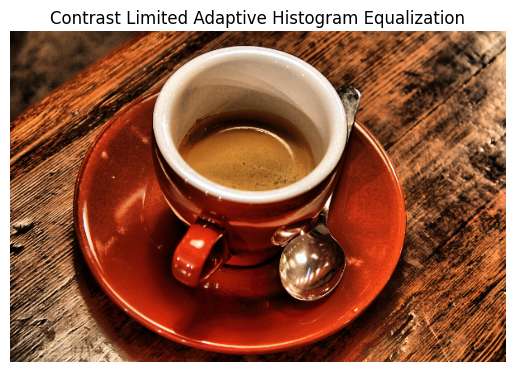

In [121]:

# Apply the adaptive equalization on the original image
adapthist_eq_image = exposure.equalize_adapthist(original_image, clip_limit=0.03)

# Compare the original image to the equalized
show_image(original_image)
show_image(adapthist_eq_image, 'Contrast Limited Adaptive Histogram Equalization')

# 7: Transformations

## 7.1: Aliasing, rotating and rescaling

In [122]:
image_cat = load_img('image_cat.jpg')

In [123]:
# Rotate the image 90 degrees clockwise 
rotated_cat_image = transform.rotate(image_cat, -90)

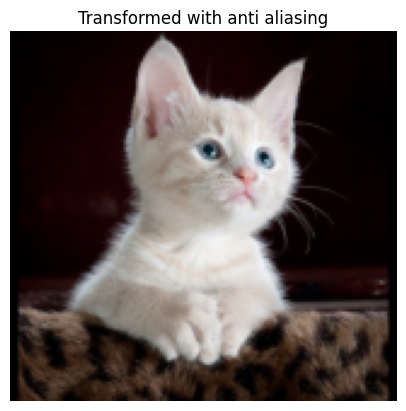

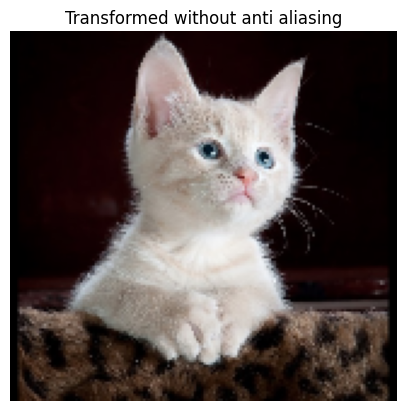

In [124]:
# Rescale with anti aliasing
rescaled_with_aa = transform.rescale(rotated_cat_image, 1/4, anti_aliasing=True, channel_axis=2) #channel_axis for colored image

# Rescale without anti aliasing
rescaled_without_aa = transform.rescale(rotated_cat_image, 1/4, anti_aliasing=False, channel_axis=2)

# Show the resulting images
show_image(rescaled_with_aa, "Transformed with anti aliasing")
show_image(rescaled_without_aa, "Transformed without anti aliasing")

## 7.2: Rescaling

In [125]:
# Load the image from data
rocket_image = data.rocket()

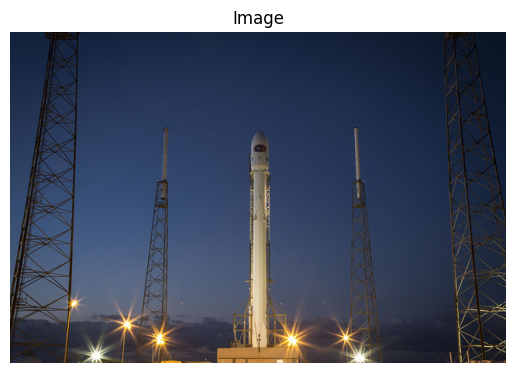

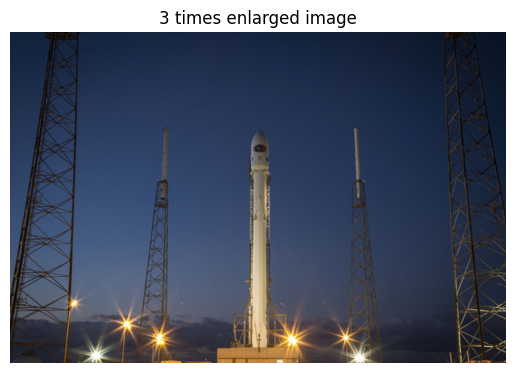

In [126]:
enlarged_rocket_image = transform.rescale(rocket_image, 3, anti_aliasing=True, channel_axis=2)
# Enlarge the image so it is 3 times bigger
enlarged_rocket_image = transform.rescale(rocket_image, 3, anti_aliasing=True, channel_axis=2)

# Show original and resulting image
show_image(rocket_image)
show_image(enlarged_rocket_image, "3 times enlarged image")


In [127]:
dogs_banner = load_img('dogs_banner.jpg')

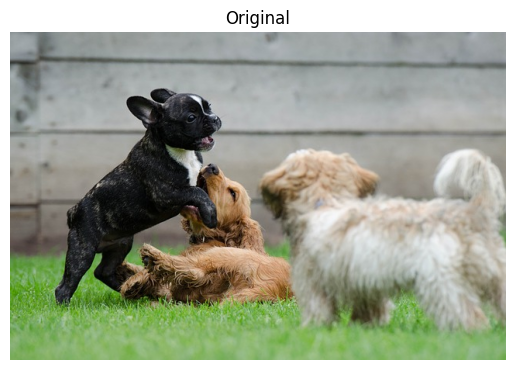

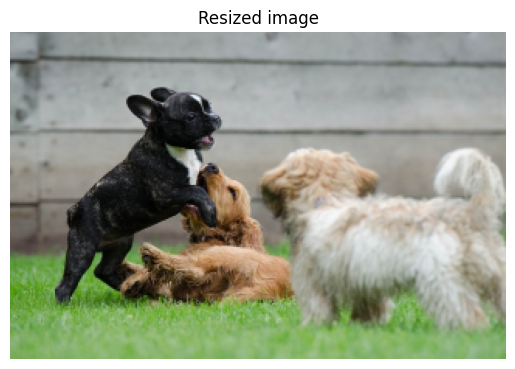

In [128]:
# Set proportional height so its half its size
height = int(dogs_banner.shape[0] / 2)
width = int(dogs_banner.shape[1] / 2)

# Resize using the calculated proportional height and width
image_resized = transform.resize(dogs_banner, (height, width),
                       anti_aliasing=True)

# Show the original and resized image
show_image(dogs_banner, 'Original')
show_image(image_resized, 'Resized image')

# 8: Morphology

In [129]:
upper_r_image = load_img('r5.png')
upper_r_image_gray = color.rgb2gray(upper_r_image)

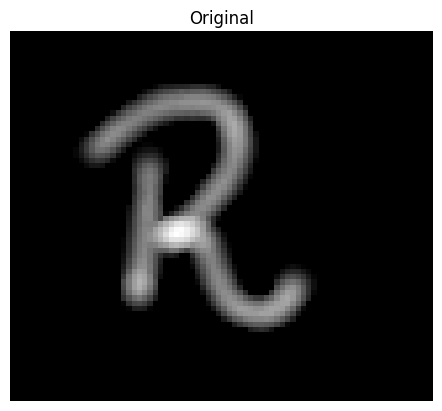

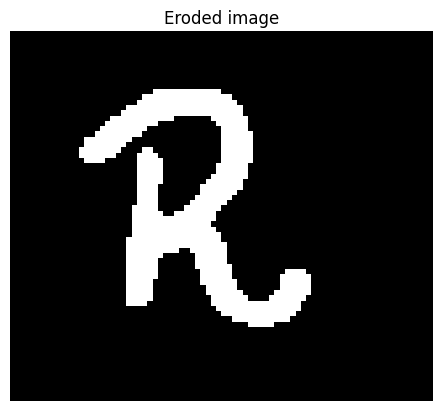

In [130]:
# Obtain the eroded shape 
eroded_image_shape = morphology.binary_erosion(upper_r_image_gray) 

# See results
show_image(upper_r_image_gray, 'Original')
show_image(eroded_image_shape, 'Eroded image')

In [131]:
world_image = load_img('world_image_binary.jpg')


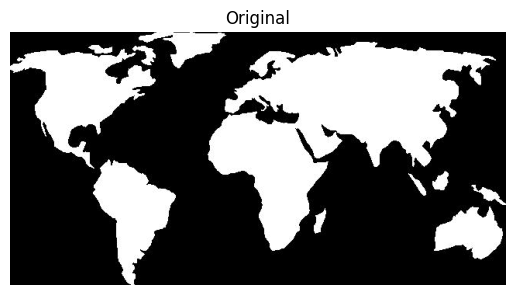

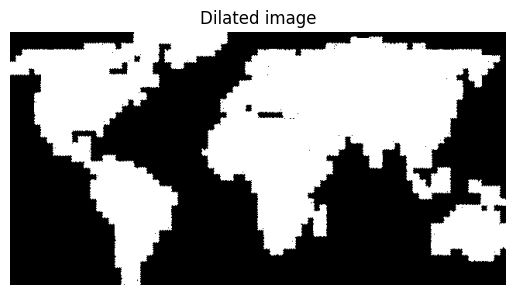

In [132]:
# Obtain the dilated image 
dilated_image = morphology.binary_dilation(world_image)

# See results
show_image(world_image, 'Original')
show_image(dilated_image, 'Dilated image')

# 9: Image Restoration

## 9.1: Inpainting

In [133]:
astronaut_img = load_img('damaged_astronaut.png')

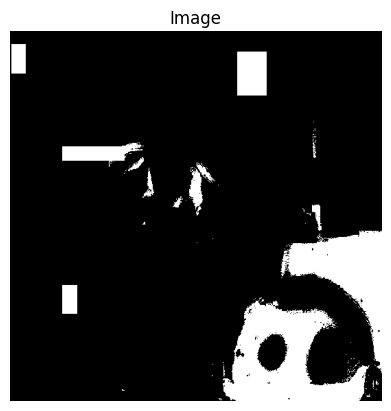

In [134]:
# Example usage
mask_astronaut = generate_dead_pixel_mask(astronaut_img)

# Mask now has 1 for dead pixels (black) and 0 for valid pixels
show_image(mask_astronaut)

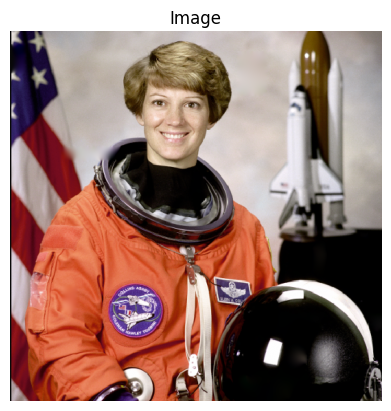

In [135]:
# Apply the restoration function to the image using the mask
restored_image = inpaint.inpaint_biharmonic(astronaut_img, mask_astronaut, channel_axis=2)
show_image(restored_image)

In [136]:
image_with_logo = load_img('4.2.06_w_logo_2_2.png')

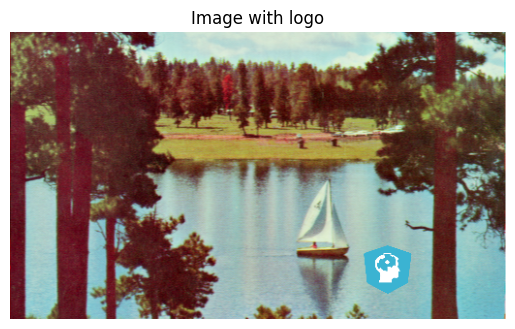

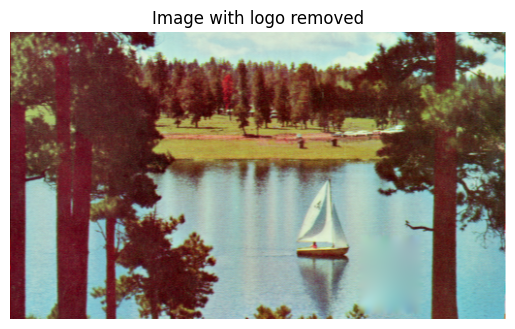

In [137]:
# Initialize the mask
mask = np.zeros(image_with_logo.shape[:-1])

# Set the pixels where the logo is to 1
mask[210:290, 360:425] = 1

# Apply inpainting to remove the logo
image_logo_removed = inpaint.inpaint_biharmonic(image_with_logo,
                                  mask,
                                  channel_axis=2)

# Show the original and logo removed images
show_image(image_with_logo, 'Image with logo')
show_image(image_logo_removed, 'Image with logo removed')

# 10: Noise

## 10.1: Adding Noise

In [138]:
fruit_image = load_img('fruits_square.jpg')

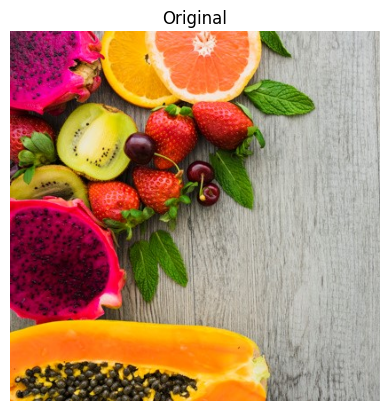

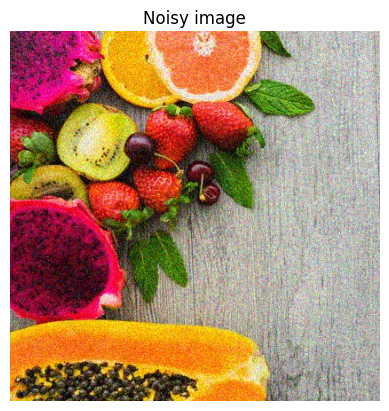

In [139]:
# Add noise to the image
noisy_image = random_noise(fruit_image)

# Show original and resulting image
show_image(fruit_image, 'Original')
show_image(noisy_image, 'Noisy image')

## 10.2: Denoising

In [140]:
noisy_image = load_img('miny.jpeg')

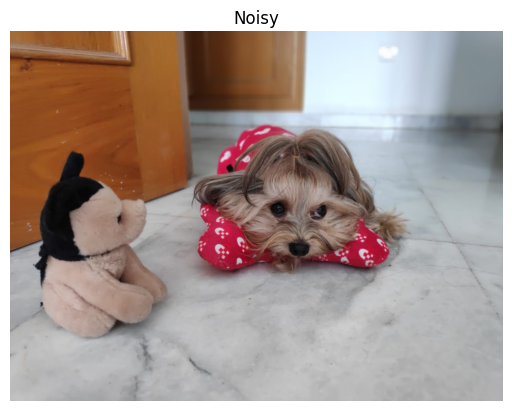

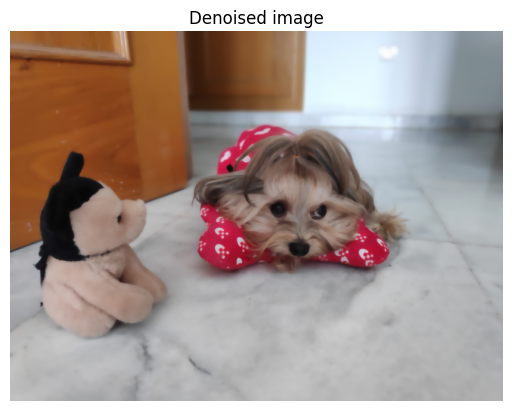

In [141]:
# Apply total variation filter denoising
denoised_image = denoise_tv_chambolle(noisy_image, 
                                      channel_axis=2)

# Show the noisy and denoised images
show_image(noisy_image, 'Noisy')
show_image(denoised_image, 'Denoised image')  

In [142]:
landscape_image = load_img('noise-noisy-nature.jpg')

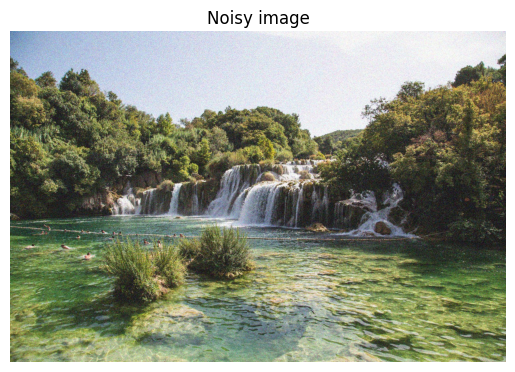

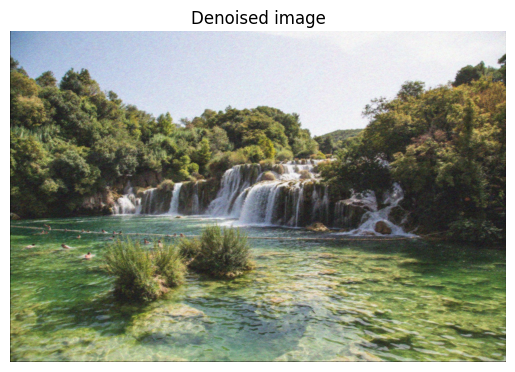

In [143]:
# Apply bilateral filter denoising
denoised_image = denoise_bilateral(landscape_image, 
                                   channel_axis=2)

# Show original and resulting images
show_image(landscape_image, 'Noisy image')
show_image(denoised_image, 'Denoised image')

# 11: Segmentation and Superpixels

## 11.1: SLIC Method

In [144]:
face_image = load_img('chinese.jpg')

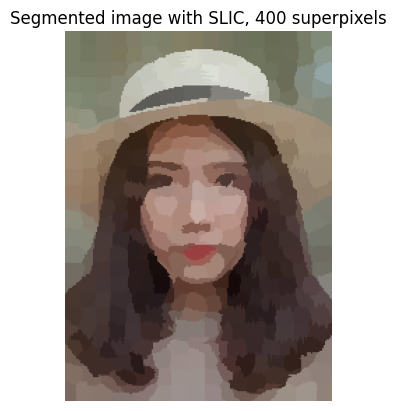

In [145]:
# Obtain the segmentation with 400 regions
segments = slic(face_image, n_segments= 400)

# Put segments on top of original image to compare
segmented_image = label2rgb(segments, face_image, kind='avg')

# Show the segmented image
show_image(segmented_image, "Segmented image with SLIC, 400 superpixels")

# 12: Finding Contours

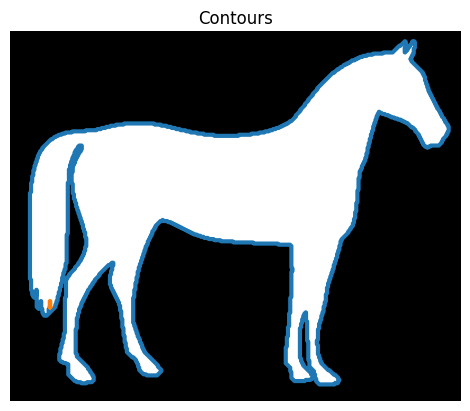

In [146]:
# Obtain the horse image
horse_image = data.horse()

# Find the contours with a constant level value of 0.8
contours = measure.find_contours(horse_image, 0.8)

# Shows the image with contours found
show_image_contour(horse_image, contours)

In [147]:
image_dice = load_img('dices.png')

In [148]:
image_dice = color.rgb2gray(image_dice)


In [149]:
# Obtain the optimal thresh value
thresh = threshold_otsu(image_dice)

In [150]:
# Apply thresholding
binary = image_dice > thresh

In [151]:
# Find contours at a constant value of 0.8
contours = measure.find_contours(binary, 0.8)


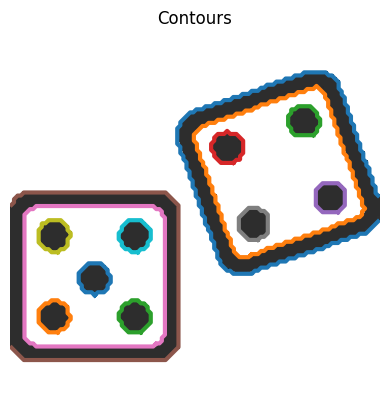

In [152]:
# Show the image
show_image_contour(image_dice, contours)

In [153]:
# Create list with the shape of each contour
shape_contours = [cnt.shape[0] for cnt in contours]
shape_contours

[255, 221, 43, 45, 41, 173, 181, 43, 45, 45, 45, 45, 45]

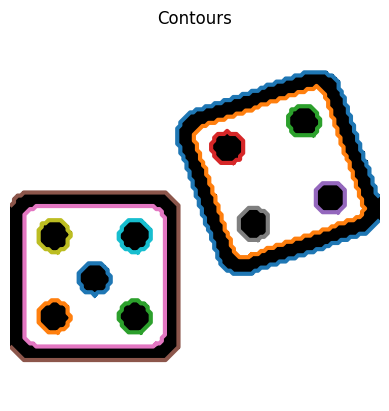

Dice's dots number: 9. 


In [154]:

# Set 50 as the maximum size of the dots shape
max_dots_shape = 50

# Count dots in contours excluding bigger than dots size
dots_contours = [cnt for cnt in contours if np.shape(cnt)[0] < max_dots_shape]

# Shows all contours found 
show_image_contour(binary, contours)

# Print the dice's number
print("Dice's dots number: {}. ".format(len(dots_contours)))

# 13: Edge Detection

## 13.1: Edge Detection Using Canny

In [155]:
grapefruit = load_img('toronjas.jpg')

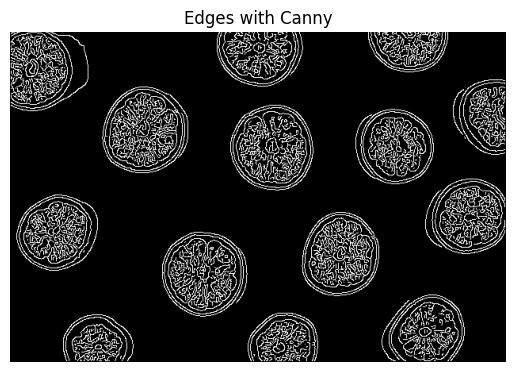

In [156]:
# Convert image to grayscale
grapefruit = color.rgb2gray(grapefruit)

# Apply canny edge detector
canny_edges = canny(grapefruit)

# Show resulting image
show_image(canny_edges, "Edges with Canny")

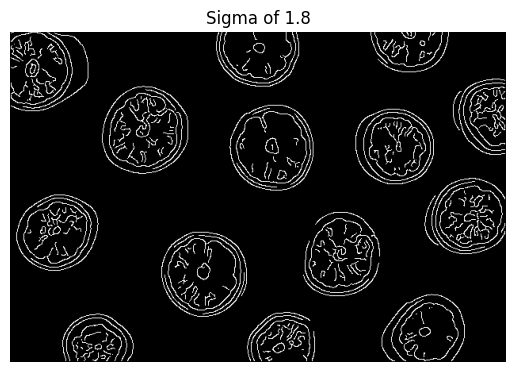

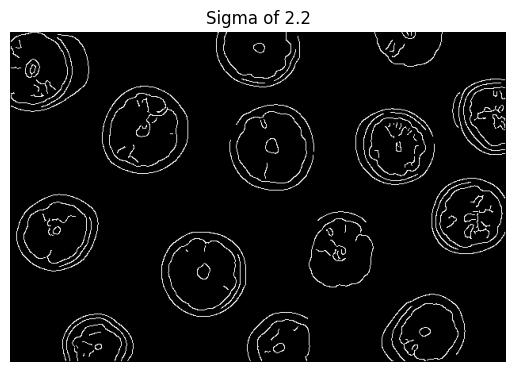

In [157]:
# Apply canny edge detector with a sigma of 1.8
edges_1_8 = canny(grapefruit, sigma=1.8)

# Apply canny edge detector with a sigma of 2.2
edges_2_2 = canny(grapefruit, sigma=2.2)

# Show resulting images
show_image(edges_1_8, "Sigma of 1.8")
show_image(edges_2_2, "Sigma of 2.2")

# 14: Corner Detection

In [158]:
building_image = load_img('corners_building_top.jpg')

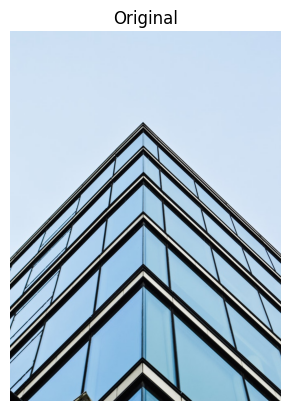

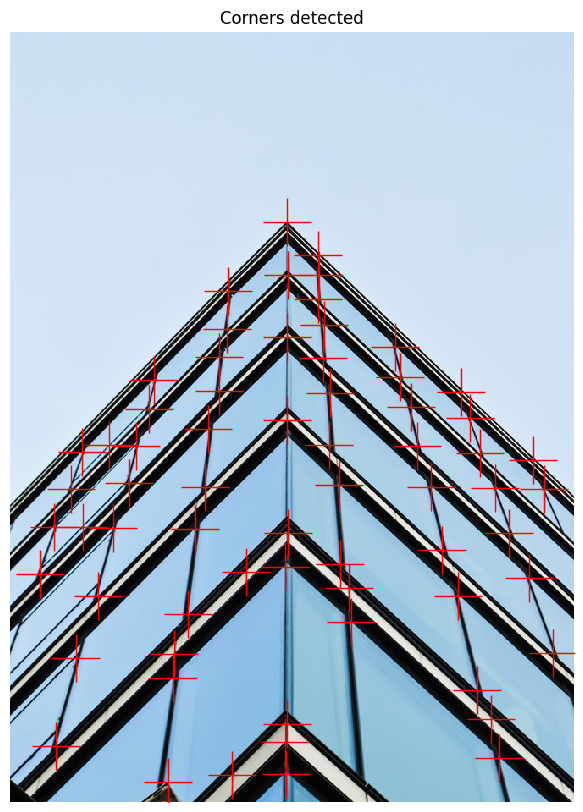

In [159]:
# Convert image from RGB-3 to grayscale
building_image_gray = color.rgb2gray(building_image)

# Apply the detector  to measure the possible corners
measure_image = corner_harris(building_image_gray)

# Find the peaks of the corners using the Harris detector
coords = corner_peaks(corner_harris(building_image_gray), min_distance=20, threshold_rel=0.02)

# Show original and resulting image with corners detected
show_image(building_image, "Original")
show_image_with_corners(building_image, coords)

In [160]:
# Find the peaks with a min distance of 10 pixels
coords_w_min_10 = corner_peaks(measure_image, min_distance=10, threshold_rel=0.02)
print("With a min_distance set to 10, we detect a total", len(coords_w_min_10), "corners in the image.")

With a min_distance set to 10, we detect a total 89 corners in the image.


In [161]:
# Find the peaks with a min distance of 60 pixels
coords_w_min_60 = corner_peaks(measure_image, min_distance=60, threshold_rel=0.02)
print("With a min_distance set to 60, we detect a total", len(coords_w_min_60), "corners in the image.")

With a min_distance set to 60, we detect a total 20 corners in the image.


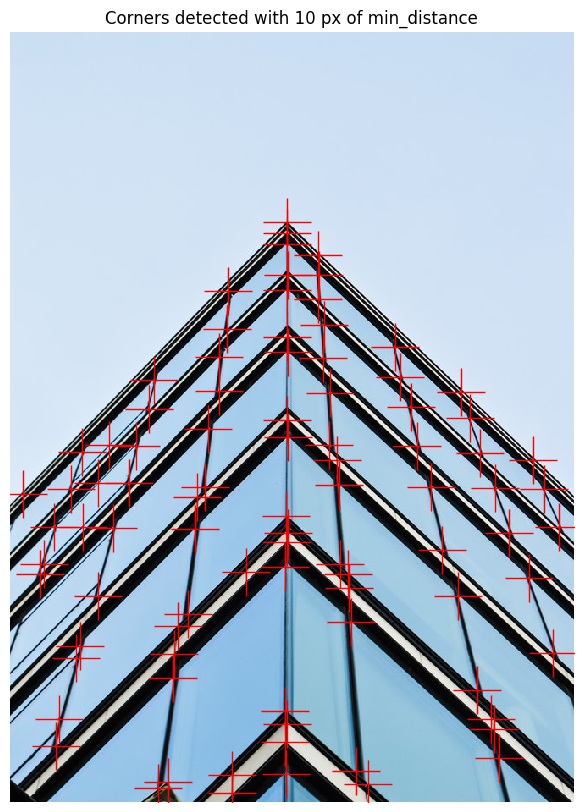

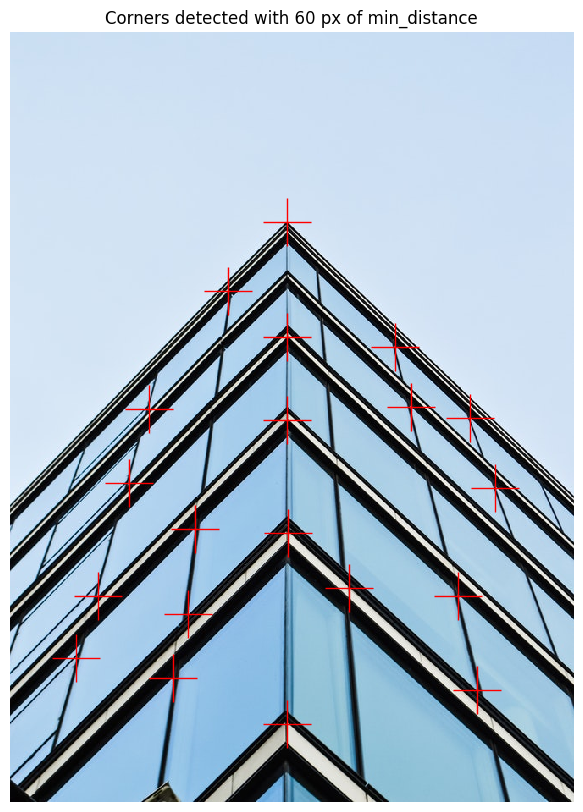

In [162]:
# Show original and resulting image with corners detected
show_image_with_corners(building_image, coords_w_min_10, "Corners detected with 10 px of min_distance")
show_image_with_corners(building_image, coords_w_min_60, "Corners detected with 60 px of min_distance")

# 15: Face Detection

In [163]:
night_image = load_img('face_det3.jpg')

Error loading image: No such file: '/mnt/c/Bordeaux_IOSD/image_journey/images/face_det3.jpg'


In [164]:
# Load the trained file from data
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade
detector = Cascade(trained_file)

# Detect faces with min and max size of searching window
detected = detector.detect_multi_scale(img = night_image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))

# Show the detected faces
show_detected_face(night_image, detected)

AttributeError: 'NoneType' object has no attribute 'shape'

In [ ]:
friends_image = load_img('face_det_friends22.jpg')

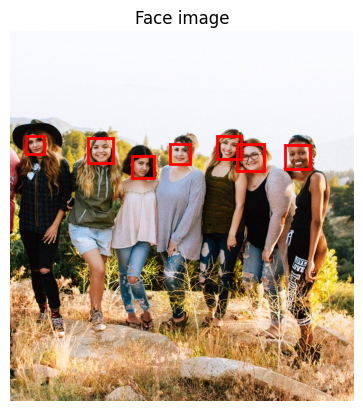

In [ ]:
# Detect faces with scale factor to 1.2 and step ratio to 1
detected = detector.detect_multi_scale(img=friends_image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))
# Show the detected faces
show_detected_face(friends_image, detected)

In [ ]:
profile_image = load_img('face_det9.jpg')

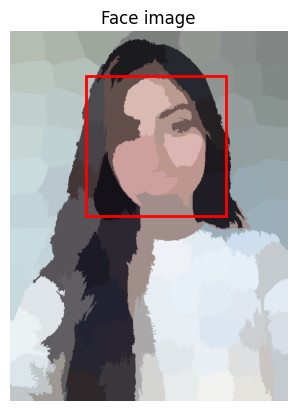

In [ ]:
# Obtain the segmentation with default 100 regions
segments = slic(profile_image, n_segments=100)

# Obtain segmented image using label2rgb
segmented_image = label2rgb(segments, profile_image, kind='avg')

# Detect the faces with multi scale method
detected = detector.detect_multi_scale(img=segmented_image, 
                                       scale_factor=1.2, 
                                       step_ratio=1, 
                                       min_size=(10, 10), max_size=(1000, 1000))

# Show the detected faces
show_detected_face(segmented_image, detected)

# 16: Privacy Protection

In [ ]:
group_image = load_img('face_det25.jpg')

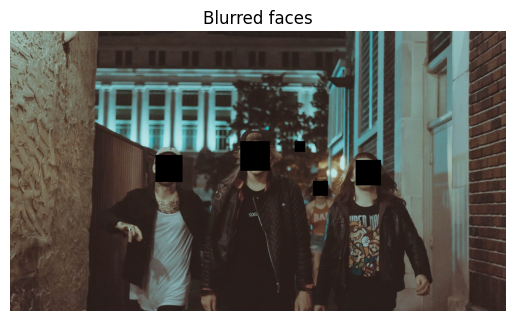

In [ ]:
# Detect the faces
detected = detector.detect_multi_scale(img=group_image, 
                                       scale_factor=1.2, step_ratio=1, 
                                       min_size=(10, 10), max_size=(100, 100))
# For each detected face
for d in detected:  
    # Obtain the face rectangle from detected coordinates
    face = getFaceRectangle(d)
    
    # Apply gaussian filter to extracted face
    blurred_face = gaussian(face, channel_axis=2, sigma = 8)
    
    # Merge this blurry face to our final image and show it
    resulting_image = mergeBlurryFace(group_image, blurred_face) 
show_image(resulting_image, "Blurred faces")

In [ ]:
damaged_image = load_img('sally2.jpg')

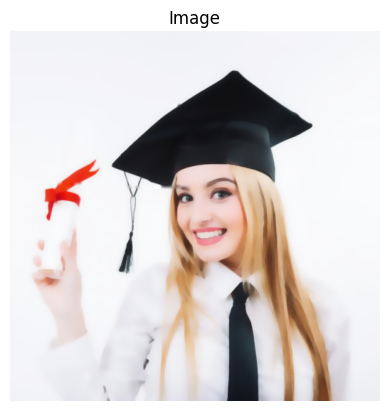

In [ ]:
# Transform the image so it's not rotated
upright_img = transform.rotate(damaged_image, 0)

# Remove noise from the image, using the chambolle method
upright_img_without_noise = denoise_tv_chambolle(upright_img,weight=0.1, channel_axis=2)

# Reconstruct the image missing parts
mask = get_mask(upright_img)
result = inpaint.inpaint_biharmonic(upright_img_without_noise, mask, channel_axis=2)

show_image(result)